In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

In [196]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
base_dir = 'D:\Research_thesis\histopathologic-cancer-detection'
print(os.listdir(base_dir))

# Matplotlib for visualization
import matplotlib.pyplot as plt
plt.style.use("ggplot")
from plotly.subplots import make_subplots
import plotly.graph_objs as go
from IPython.display import display, HTML, Javascript
# OpenCV Image Library
import cv2

# Import PyTorch
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import utils
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim

# Import useful sklearn functions
import sklearn
from sklearn.metrics import roc_auc_score
from PIL import Image
from PIL import Image, ImageDraw
%matplotlib inline

['sample_submission.csv', 'test', 'train', 'train_labels.csv']


In [197]:
from IPython.display import display, HTML, Javascript

color_map = ['#FFFFFF','#FF5733']

prompt = color_map[-1]
main_color = color_map[0]
strong_main_color = color_map[1]
custom_colors = [strong_main_color, main_color]

css_file = '''
div #notebook {
background-color: white;
line-height: 20px;
}

#notebook-container {
%s
margin-top: 2em;
padding-top: 2em;
border-top: 4px solid %s;
-webkit-box-shadow: 0px 0px 8px 2px rgba(224, 212, 226, 0.5);
    box-shadow: 0px 0px 8px 2px rgba(224, 212, 226, 0.5);
}

div .input {
margin-bottom: 1em;
}

.rendered_html h1, .rendered_html h2, .rendered_html h3, .rendered_html h4, .rendered_html h5, .rendered_html h6 {
color: %s;
font-weight: 600;
}

div.input_area {
border: none;
    background-color: %s;
    border-top: 2px solid %s;
}

div.input_prompt {
color: %s;
}

div.output_prompt {
color: %s; 
}

div.cell.selected:before, div.cell.selected.jupyter-soft-selected:before {
background: %s;
}

div.cell.selected, div.cell.selected.jupyter-soft-selected {
    border-color: %s;
}

.edit_mode div.cell.selected:before {
background: %s;
}

.edit_mode div.cell.selected {
border-color: %s;

}
'''

def to_rgb(h): 
    return tuple(int(h[i:i+2], 16) for i in [0, 2, 4])

main_color_rgba = 'rgba(%s, %s, %s, 0.1)' % (to_rgb(main_color[1:]))
open('notebook.css', 'w').write(css_file % ('width: 95%;', main_color, main_color, main_color_rgba, 
                                            main_color,  main_color, prompt, main_color, main_color, 
                                            main_color, main_color))

def nb(): 
    return HTML("<style>" + open("notebook.css", "r").read() + "</style>")
nb()

In [198]:
print("Train Size: {}".format(len(os.listdir('D:\Research_thesis\histopathologic-cancer-detection/train'))))
print("Test Size: {}".format(len(os.listdir('D:\Research_thesis\histopathologic-cancer-detection/test'))))

Train Size: 220025
Test Size: 57458


In [199]:
full_train_df = pd.read_csv("D:\Research_thesis\histopathologic-cancer-detection/train_labels.csv")
full_train_df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


In [200]:
full_train_df.shape

(220025, 2)

In [201]:
full_train_df[full_train_df.duplicated(keep=False)]

,id,label


In [202]:
full_train_df['label'].value_counts()

label
0    130908
1     89117
Name: count, dtype: int64

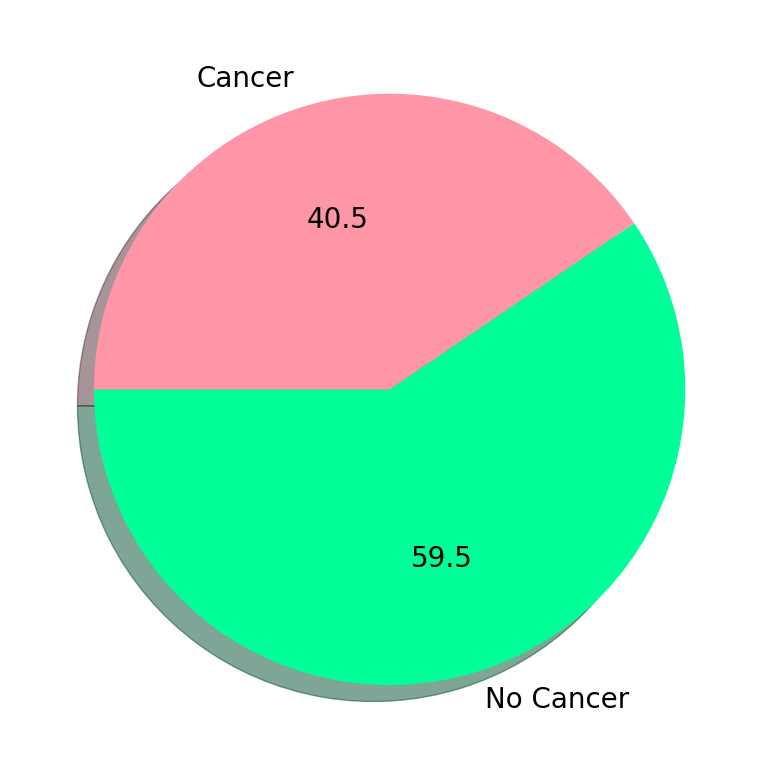

<Figure size 1600x1600 with 0 Axes>

In [203]:
labels_count = full_train_df.label.value_counts()

%matplotlib inline
plt.pie(labels_count, labels=['No Cancer', 'Cancer'], startangle=180, 
        autopct='%1.1f', colors=['#00ff99','#FF96A7'], shadow=True)
plt.figure(figsize=(16,16))
plt.show()

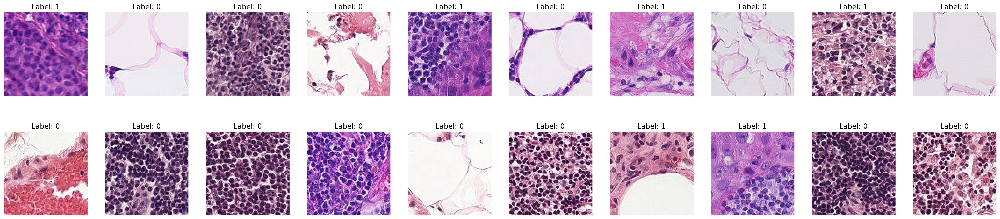

In [204]:
fig = plt.figure(figsize=(36, 8))
# display 20 images
train_imgs = os.listdir(base_dir+"/train")
for idx, img in enumerate(np.random.choice(train_imgs, 20)):
    ax = fig.add_subplot(2, 20//2, idx+1, xticks=[], yticks=[])
    im = Image.open(base_dir+"/train/" + img)
    plt.imshow(im)
    lab = full_train_df.loc[full_train_df['id'] == img.split('.')[0], 'label'].values[0]
    ax.set_title('Label: %s'%lab)

In [205]:
imgpath ="D:\Research_thesis\histopathologic-cancer-detection/train/"
malignant = full_train_df.loc[full_train_df['label']==1]['id'].values
normal = full_train_df.loc[full_train_df['label']==0]['id'].values
print('normal ids')
print(normal[0:3],'\n')

print('malignant ids')
print(malignant[0:3])

normal ids
['f38a6374c348f90b587e046aac6079959adf3835'
 '755db6279dae599ebb4d39a9123cce439965282d'
 'bc3f0c64fb968ff4a8bd33af6971ecae77c75e08'] 

malignant ids
['c18f2d887b7ae4f6742ee445113fa1aef383ed77'
 'a24ce148f6ffa7ef8eefb4efb12ebffe8dd700da'
 '7f6ccae485af121e0b6ee733022e226ee6b0c65f']


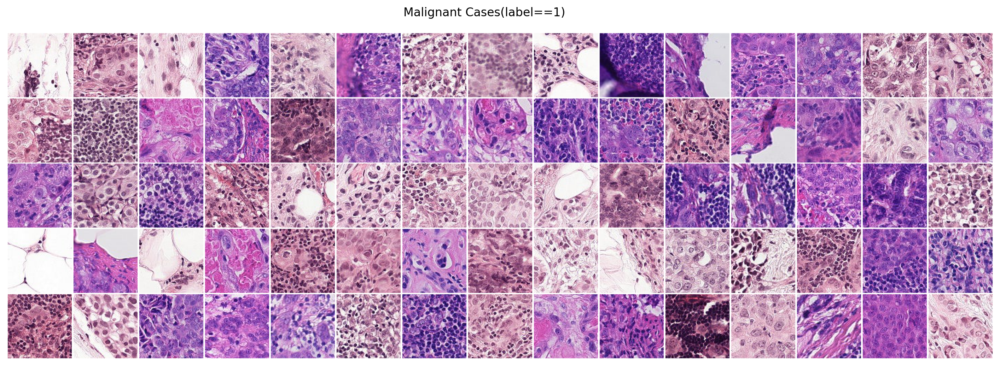

In [206]:
def plot_fig(ids,title,nrows=5,ncols=15):

    fig,ax = plt.subplots(nrows,ncols,figsize=(18,6))
    plt.subplots_adjust(wspace=0, hspace=0) 
    for i,j in enumerate(ids[:nrows*ncols]):
        fname = os.path.join(imgpath ,j +'.tif')
        img = Image.open(fname)
        idcol = ImageDraw.Draw(img)
        idcol.rectangle(((0,0),(95,95)),outline='white')
        plt.subplot(nrows, ncols, i+1) 
        plt.imshow(np.array(img))
        plt.axis('off')

    plt.suptitle(title, y=0.94)
plot_fig(malignant,'Malignant Cases(label==1)')

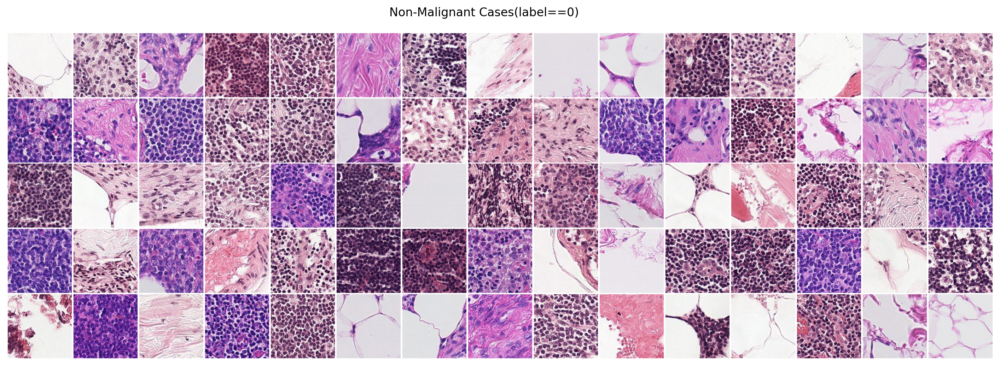

In [207]:
plot_fig(normal,'Non-Malignant Cases(label==0)')

In [208]:
#SAMPLE_SIZE = 80000

# Data paths
#train_path = 'D:\Research_thesis\histopathologic-cancer-detection/train'
#test_path = 'D:\Research_thesis\histopathologic-cancer-detection//test'

# Use 80000 positive and negative examples
#df_negatives = full_train_df[full_train_df['label'] == 0].sample(SAMPLE_SIZE, random_state=42)
#df_positives = full_train_df[full_train_df['label'] == 1].sample(SAMPLE_SIZE, random_state=42)

# Concatenate the two dfs and shuffle them up
#train_df = sklearn.utils.shuffle(pd.concat([df_positives, df_negatives], axis=0).reset_index(drop=True))

#train_df.shape

In [285]:
# Our own custom class for datasets
torch.manual_seed(0) # fix random seed

class pytorch_data(Dataset):
    
    def __init__(self,data_dir,transform,data_type="train"):      
    
        # Get Image File Names
        cdm_data=os.path.join(data_dir,data_type)  # directory of files
        
        file_names = os.listdir(cdm_data) # get list of images in that directory  
        idx_choose = np.random.choice(np.arange(len(file_names)), 8000,replace=False).tolist()
        file_names_sample = [file_names[x] for x in idx_choose]
        self.full_filenames = [os.path.join(cdm_data, f) for f in file_names_sample]   # get the full path to images
        
        # Get Labels
        labels_data=os.path.join(data_dir,"train_labels.csv") 
        labels_df=pd.read_csv(labels_data)
        labels_df.set_index("id", inplace=True) # set data frame index to id
        self.labels = [labels_df.loc[filename[:-4]].values[0] for filename in file_names_sample]  # obtained labels from df
        self.transform = transform
      
    def __len__(self):
        return len(self.full_filenames) # size of dataset
      
    def __getitem__(self, idx):
        # open image, apply transforms and return with label
        image = Image.open(self.full_filenames[idx])  # Open Image with PIL
        image = self.transform(image) # Apply Specific Transformation to Image
        return image, self.labels[idx]

In [286]:
# define transformation that converts a PIL image into PyTorch tensors
import torchvision.transforms as transforms
data_transformer = transforms.Compose([transforms.ToTensor(),transforms.Resize((40, 40), antialias=True)])

In [287]:
# Define an object of the custom dataset for the train folder.
data_dir = 'D:\Research_thesis\histopathologic-cancer-detection/'
img_dataset = pytorch_data(data_dir, data_transformer, "train")

In [288]:
# Load an example tensor
img, label = img_dataset[10]
print(img.shape, torch.min(img), torch.max(img))

torch.Size([3, 40, 40]) tensor(0.1998) tensor(0.9811)


In [289]:
#random_split
len_img = len(img_dataset)
len_train = int(0.8 * len_img)
len_val = len_img - len_train

# Split PyTorch tensor
train_ts, val_ts = random_split(img_dataset, [len_train, len_val])  # random split 80/20

print("train dataset size:", len(train_ts))
print("validation dataset size:", len(val_ts))


train dataset size: 6400
validation dataset size: 1600


In [290]:
# getting the torch tensor image & target variable
for i, (x, y) in enumerate(train_ts):
    print(x.shape, y)
    if i >= 6:
        break

torch.Size([3, 40, 40]) 0
torch.Size([3, 40, 40]) 0
torch.Size([3, 40, 40]) 1
torch.Size([3, 40, 40]) 1
torch.Size([3, 40, 40]) 1
torch.Size([3, 40, 40]) 1
torch.Size([3, 40, 40]) 1


In [291]:
import plotly.express as px

def plot_img(x,y,title=None):

    npimg = x.numpy() # convert tensor to numpy array
    npimg_tr=np.transpose(npimg, (1,2,0)) # Convert to H*W*C shape
    fig = px.imshow(npimg_tr)
    fig.update_layout(template='plotly_white')
    fig.update_layout(title=title,height=300,margin={'l':10,'r':20,'b':10})
    fig.show()

In [292]:
#Training subset examples
# Create grid of sample images
grid_size = 30
rnd_inds = np.random.randint(0, len(train_ts), grid_size)
print("image indices:", rnd_inds)

x_grid_train = [train_ts[i][0] for i in rnd_inds]
y_grid_train = [train_ts[i][1] for i in rnd_inds]

x_grid_train = utils.make_grid(x_grid_train, nrow=10, padding=2)
print(x_grid_train.shape)

plot_img(x_grid_train, y_grid_train, 'Training Subset Examples')


image indices: [3197 2809  852 3605 6241 1302 1295 4785 6031  731  567 5817  218 3622
  848 1054 1952 6058   66 3471 1687 1953 4714 2023 1712 1833 2030 5668
 4005 2220]
torch.Size([3, 128, 422])


In [293]:
# Validation dataset preview
grid_size = 30
rnd_inds = np.random.randint(0, len(val_ts), grid_size)
print("image indices:", rnd_inds)

x_grid_val = [val_ts[i][0] for i in rnd_inds]
y_grid_val = [val_ts[i][1] for i in rnd_inds]

x_grid_val = utils.make_grid(x_grid_val, nrow=10, padding=2)
print(x_grid_val.shape)

plot_img(x_grid_val, y_grid_val, 'Validation Dataset Preview')


image indices: [1558  464  982  625 1346   26  619  624   99 1052  256 1327  449  995
  484  127  653  388  174  138  619 1360  228  843 1599 1153  646  689
 1220  239]
torch.Size([3, 128, 422])


In [294]:
# Define the following transformations for the training dataset
tr_transf = transforms.Compose([
#     transforms.Resize((40,40)),
    transforms.RandomHorizontalFlip(p=0.5), 
    transforms.RandomVerticalFlip(p=0.5),  
    transforms.RandomRotation(45),         
#     transforms.RandomResizedCrop(50,scale=(0.8,1.0),ratio=(1.0,1.0)),
    transforms.ToTensor()])


In [295]:
# For the validation dataset, we don't need any augmentation; simply convert images into tensors
val_transf = transforms.Compose([
    transforms.ToTensor()])

In [296]:
# After defining the transformations, overwrite the transform functions of train_ts, val_ts
train_ts.transform=tr_transf
val_ts.transform=val_transf

In [297]:
# The subset can also have transform attribute (if we asign)
train_ts.transform


Compose(
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.5)
    RandomRotation(degrees=[-45.0, 45.0], interpolation=nearest, expand=False, fill=0)
    ToTensor()
)

In [298]:
#Creating Dataloaders
from torch.utils.data import DataLoader

# Training DataLoader
train_dl = DataLoader(train_ts, batch_size=32, shuffle=True)

# Validation DataLoader
val_dl = DataLoader(val_ts, batch_size=32, shuffle=False)


In [299]:
# check samples
for x,y in train_dl:
    print(x.shape,y)
    break

torch.Size([32, 3, 40, 40]) tensor([1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0])


In [300]:
#Defining Binary Classifier
def find_conv2d_out_shape(hin, win, conv, pool=2):
    # Unpack conv arguments
    kernel_size, stride, padding, dilation = conv.kernel_size, conv.stride, conv.padding, conv.dilation

    hout = int((hin + 2 * padding[0] - dilation[0] * (kernel_size[0] - 1) - 1) / stride[0] + 1)
    wout = int((win + 2 * padding[1] - dilation[1] * (kernel_size[1] - 1) - 1) / stride[1] + 1)

    if pool:
        hout /= pool
        wout /= pool
    return int(hout), int(wout)

import torch.nn as nn
import torch.nn.functional as F


In [303]:
import torch.nn as nn
import torch.nn.functional as F

class Network(nn.Module):
    def __init__(self, params):
        super(Network, self).__init__()
        
        Cin, Hin, Win = params["shape_in"]
        init_f = params["initial_filters"]
        num_fc1 = params["num_fc1"]
        num_classes = params["num_classes"]
        self.dropout_rate = params["dropout_rate"]

        # Convolution Layers
        self.conv1 = nn.Conv2d(Cin, init_f, kernel_size=3)
        h, w = find_conv2d_out_shape(Hin, Win, self.conv1)
        self.conv2 = nn.Conv2d(init_f, 2 * init_f, kernel_size=3)
        h, w = find_conv2d_out_shape(h, w, self.conv2)
        self.conv3 = nn.Conv2d(2 * init_f, 4 * init_f, kernel_size=3)
        h, w = find_conv2d_out_shape(h, w, self.conv3)
        self.conv4 = nn.Conv2d(4 * init_f, 8 * init_f, kernel_size=3)
        h, w = find_conv2d_out_shape(h, w, self.conv4)

        # Compute the flatten size
        self.num_flatten = h * w * 8 * init_f
        self.fc1 = nn.Linear(self.num_flatten, num_fc1)
        self.fc2 = nn.Linear(num_fc1, num_classes)

    def forward(self, X):
        # Convolution & Pool Layers
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv3(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv4(X))
        X = F.max_pool2d(X, 2, 2)

        X = X.view(-1, self.num_flatten)

        X = F.relu(self.fc1(X))
        X = F.dropout(X, self.dropout_rate)
        X = self.fc2(X)
        return F.log_softmax(X, dim=1)



In [304]:
# Neural Network Predefined Parameters
params_model = {
    "shape_in": (3, 46, 46),
    "initial_filters": 8,
    "num_fc1": 100,
    "dropout_rate": 0.25,
    "num_classes": 2
}


In [305]:
# Create instantiation of Network class
cnn_model = Network(params_model)

In [306]:
# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
    device = torch.device("cuda")          # CUDA device object
    print(f"CUDA is available! Using GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")           # CPU device object
    print("CUDA is not available. Using CPU instead.")


CUDA is available! Using GPU: NVIDIA GeForce GTX 1660 SUPER


In [307]:
# define computation hardware approach (GPU/CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = cnn_model.to(device)

In [308]:
from torchsummary import summary
summary(cnn_model, input_size=(3, 46, 46),device=device.type)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 44, 44]             224
            Conv2d-2           [-1, 16, 20, 20]           1,168
            Conv2d-3             [-1, 32, 8, 8]           4,640
            Conv2d-4             [-1, 64, 2, 2]          18,496
            Linear-5                  [-1, 100]           6,500
            Linear-6                    [-1, 2]             202
Total params: 31,230
Trainable params: 31,230
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.02
Forward/backward pass size (MB): 0.19
Params size (MB): 0.12
Estimated Total Size (MB): 0.33
----------------------------------------------------------------


In [310]:
 #create a complete CNN
print(cnn_model)

Network(
  (conv1): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1))
  (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=64, out_features=100, bias=True)
  (fc2): Linear(in_features=100, out_features=2, bias=True)
)


In [311]:
# Calculate the number of trainable parameters using predefined parameters
num_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters using predefined parameters: {num_trainable_params}")

Number of trainable parameters using predefined parameters: 31230


In [312]:

# specify optimizer
opt = optim.Adam(cnn_model.parameters(), lr=1e-4)
lr_scheduler = ReduceLROnPlateau(opt, mode='min',factor=0.5, patience=20,verbose=1)


In [313]:
# Training Model
# helper Function
# Function to get the learning rate
def get_lr(opt):
    for param_group in opt.param_groups:
        return param_group['lr']


In [314]:
# Function to compute the loss value per batch of data
def loss_batch(loss_func, output, target, opt=None):
    
    loss = loss_func(output, target) # get loss
    pred = output.argmax(dim=1, keepdim=True) # Get Output Class
    metric_b=pred.eq(target.view_as(pred)).sum().item() # get performance metric
    if opt is not None:
        opt.zero_grad()
        loss.backward()
        opt.step()

    return loss.item(), metric_b

In [315]:
def loss_epoch(model, loss_func, dataset_dl, opt=None):
    run_loss = 0.0 
    t_metric = 0.0
    len_data = len(dataset_dl.dataset)

    # Internal loop over dataset
    for xb, yb in dataset_dl:
        # Move batch to device
        xb, yb = xb.to(device), yb.to(device)
        output = model(xb)  # Get model output
        loss_b, metric_b = loss_batch(loss_func, output, yb, opt)  # Get loss per batch
        run_loss += loss_b        # Update running loss

        if metric_b is not None:  # Update running metric
            t_metric += metric_b    
    
    loss = run_loss / float(len_data)  # Average loss value
    metric = t_metric / float(len_data)  # Average metric value
    
    return loss, metric


In [316]:
params_train = {
    "train": train_dl,
    "val": val_dl,
    "epochs": 50,
    "optimizer": optim.Adam(cnn_model.parameters(), lr=1e-4),
    "lr_scheduler": ReduceLROnPlateau(optim.Adam(cnn_model.parameters(), lr=1e-4),
                                      mode='min',
                                      factor=0.5,
                                      patience=20,
                                      verbose=0),
    "loss_function": nn.NLLLoss(reduction="sum"),
    "weight_path": "weights.pt",
    "check": False,
}


In [267]:
# main training function
import copy
from tqdm import tqdm
from tqdm.notebook import trange, tqdm

def train_val(model, params, verbose=False):
    # Get the parameters
    epochs = params["epochs"]
    loss_func = params["loss_function"]
    optimizer = params["optimizer"]
    train_dl = params["train"]
    val_dl = params["val"]
    lr_scheduler = params["lr_scheduler"]
    weight_path = params["weight_path"]

    loss_history = {"train": [], "val": []} # history of loss values in each epoch
    metric_history = {"train": [], "val": []} # history of metric values in each epoch
    best_model_wts = copy.deepcopy(model.state_dict()) # a deep copy of weights for the best performing model
    best_loss = float('inf') # initialize best loss to a large value


# ''' Train Model n_epochs '''

    for epoch in tqdm(range(epochs), desc='Training Progress', leave=False):
        current_lr = get_lr(optimizer)
        if verbose:
            print(f'Epoch {epoch}/{epochs - 1}, current lr={current_lr}')

# Early Stopping


#''' Train Model Process '''

        model.train()
        train_loss, train_metric = loss_epoch(model, loss_func, train_dl, optimizer)
        
        # collect losses
        
        loss_history["train"].append(train_loss)
        metric_history["train"].append(train_metric)
        
#''' Evaluate Model Process '''
        model.eval()
        with torch.no_grad():
            val_loss, val_metric = loss_epoch(model, loss_func, val_dl)
            
# store best model

        if val_loss < best_loss:
            best_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            
 # store weights into a local file
 
            torch.save(model.state_dict(), weight_path)
            if verbose:
                print("Copied best model weights!")

 # collect loss and metric for validation dataset
 
        loss_history["val"].append(val_loss)
        metric_history["val"].append(val_metric)

# learning rate schedule

        lr_scheduler.step(val_loss)
        if current_lr != get_lr(optimizer):
            if verbose:
                print("Loading best model weights!")
            model.load_state_dict(best_model_wts)

        if verbose:
            print(f"train loss: {train_loss:.6f}, dev loss: {val_loss:.6f}, accuracy: {100 * val_metric:.2f}")
            print("-" * 10)
# load best model weights
    model.load_state_dict(best_model_wts)
    return model, loss_history, metric_history


In [269]:
# Define parameters
params_train = {
    "train": train_dl,
    "val": val_dl,
    "epochs": 50,
    "optimizer": optim.Adam(cnn_model.parameters(), lr=1e-4),
    "lr_scheduler": ReduceLROnPlateau(optim.Adam(cnn_model.parameters(), lr=1e-4),
                                      mode='min',
                                      factor=0.5,
                                      patience=20,
                                      verbose=1),
    "loss_function": nn.NLLLoss(reduction="sum"),
    "weight_path": "weights.pt",
}

# Train and evaluate the model with verbose output
cnn_model, loss_hist, metric_hist = train_val(cnn_model, params_train, verbose=True)



Training Progress:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 0/49, current lr=0.0001


RuntimeError: Given input size: (64x1x1). Calculated output size: (64x0x0). Output size is too small

In [ ]:
#Loss and Evalution Metric


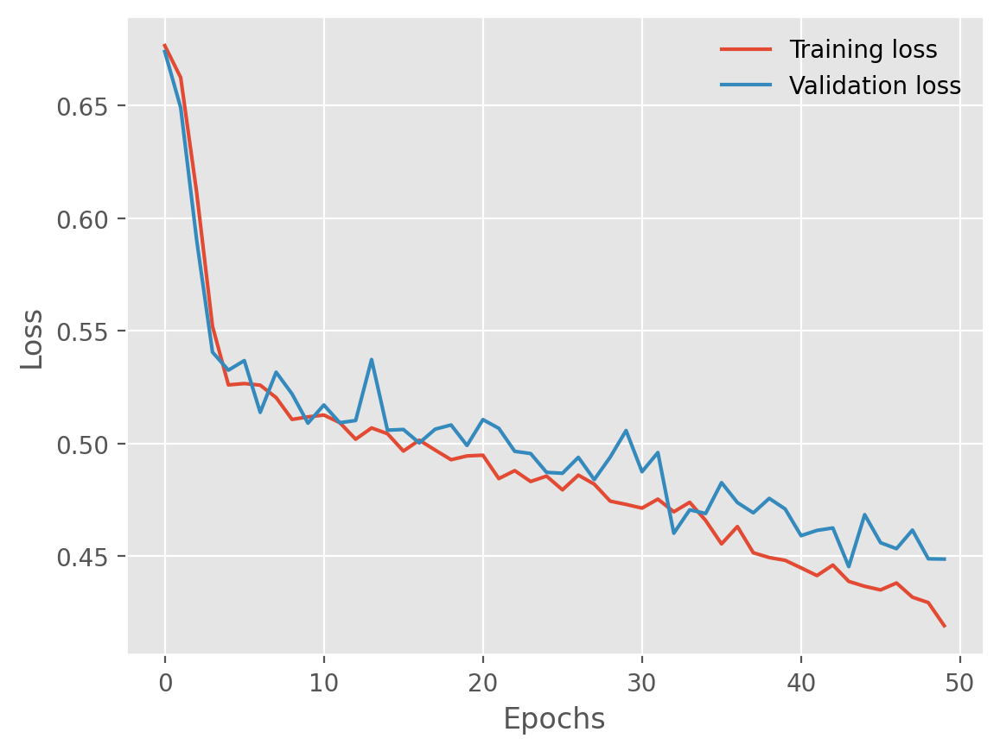

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(loss_hist["train"], label='Training loss')
plt.plot(loss_hist["val"], label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(frameon=False)

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(auc_epoch, label='Validation AUC/Epochs')
plt.legend("")
plt.xlabel("Epochs")
plt.ylabel("Area Under the Curve")
plt.legend(frameon=False)

NameError: name 'auc_epoch' is not defined

In [ ]:
# Load Best parameters learned from training into our model to make predictions later
model.load_state_dict(torch.load('best_model.pt'))

RuntimeError: Error(s) in loading state_dict for Network:
	Missing key(s) in state_dict: "conv1.weight", "conv1.bias", "conv2.weight", "conv2.bias", "conv3.weight", "conv3.bias", "conv4.weight", "conv4.bias", "fc1.weight", "fc1.bias", "fc2.weight", "fc2.bias". 
	Unexpected key(s) in state_dict: "conv5.0.weight", "conv5.0.bias", "conv5.1.weight", "conv5.1.bias", "conv5.1.running_mean", "conv5.1.running_var", "conv5.1.num_batches_tracked", "fc.0.weight", "fc.0.bias", "fc.3.weight", "fc.3.bias", "fc.5.weight", "fc.5.bias", "conv1.0.weight", "conv1.0.bias", "conv1.1.weight", "conv1.1.bias", "conv1.1.running_mean", "conv1.1.running_var", "conv1.1.num_batches_tracked", "conv2.0.weight", "conv2.0.bias", "conv2.1.weight", "conv2.1.bias", "conv2.1.running_mean", "conv2.1.running_var", "conv2.1.num_batches_tracked", "conv3.0.weight", "conv3.0.bias", "conv3.1.weight", "conv3.1.bias", "conv3.1.running_mean", "conv3.1.running_var", "conv3.1.num_batches_tracked", "conv4.0.weight", "conv4.0.bias", "conv4.1.weight", "conv4.1.bias", "conv4.1.running_mean", "conv4.1.running_var", "conv4.1.num_batches_tracked". 

Prediction on Test set 

In [ ]:
# Turn off gradients
model.eval()

preds = []
for batch_i, (data, target) in enumerate(test_loader):
    data, target = data.cuda(), target.cuda()
    output = model(data)

    pr = output.detach().cpu().numpy()
    for i in pr:
        preds.append(i)

# Create Submission file        
sample_sub['label'] = preds

KeyboardInterrupt: 

In [ ]:
for i in range(len(sample_sub)):
    sample_sub['label'] = sample_sub['label'].astype(float)

In [ ]:
sample_sub.to_csv('submission.csv', index=False)
sample_sub.head()

,id,label
0,0b2ea2a822ad23fdb1b5dd26653da899fbd2c0d5,1.999475e-07
1,95596b92e5066c5c52466c90b69ff089b39f2737,2.282590e-02
2,248e6738860e2ebcf6258cdc1f32f299e0c76914,7.753618e-05
3,2c35657e312966e9294eac6841726ff3a748febf,2.947019e-06
4,145782eb7caa1c516acbe2eda34d9a3f31c41fd6,1.086614e-04


Visualizing Prediction:

In [ ]:
def imshow(img):
    '''Helper function to un-normalize and display an image'''
    # unnormalize
    img = img / 2 + 0.5
    # convert from Tensor image and display
    plt.imshow(np.transpose(img, (1, 2, 0)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

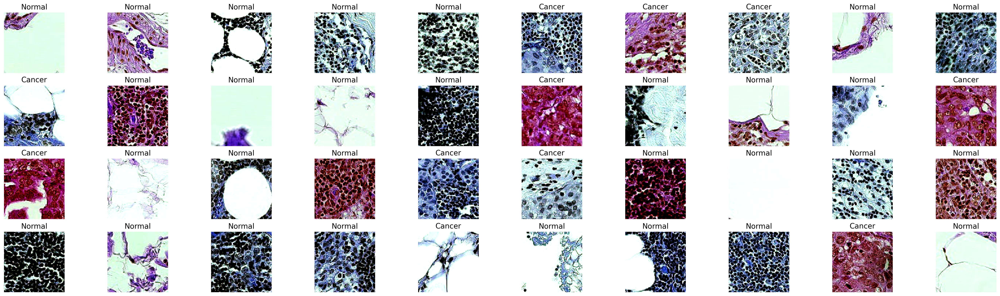

In [ ]:
# obtain one batch of training images
dataiter = iter(test_loader)
images, labels = next(dataiter)
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(36, 10))
# display 20 images
for idx in np.arange(40):
    ax = fig.add_subplot(4, 10, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    prob = "Cancer" if(sample_sub.label[idx] >= 0.5) else "Normal" 
    ax.set_title('{}'.format(prob))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

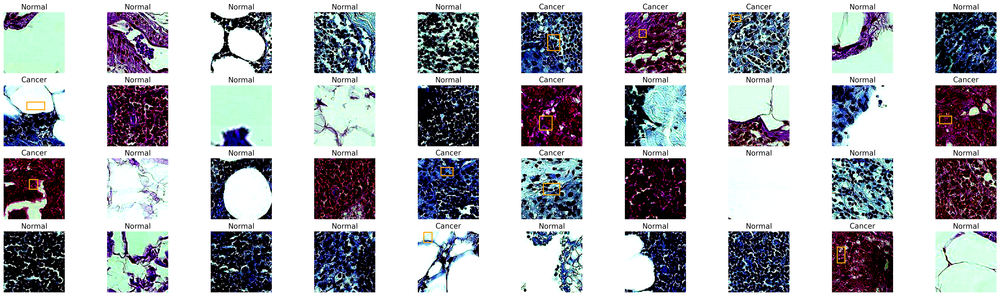

In [ ]:
# a function 'imshow' for displaying images
def imshow(image):
    plt.imshow(np.transpose(image, (1, 2, 0)))  # Adjust if needed
    plt.axis('off')

# Function to highlight a region in the image
def highlight_region(image, region_coordinates):
    # Create a copy of the image to avoid modifying the original
    image_with_highlight = np.copy(image)

    # Extract region coordinates
    x, y, width, height = region_coordinates

    # Draw a rectangle around the specified region
    rect = plt.Rectangle((x, y), width, height, fill=False, edgecolor='orange', linewidth=2)
    plt.gca().add_patch(rect)

    # Display the image with the highlighted region
    imshow(image_with_highlight)

# Example usage:
# loading data and labels
dataiter = iter(test_loader)
images, labels = next(dataiter)
images = images.numpy()  # convert images to numpy for display

# Generate region coordinates dynamically for each image
region_coordinates_list = [
    (x, y, width, height) for x, y, width, height in zip(np.random.randint(0, 50, len(images)),
                                                         np.random.randint(0, 50, len(images)),
                                                         np.random.randint(10, 30, len(images)),
                                                         np.random.randint(10, 30, len(images)))
]

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(36, 10))
# display images
for idx in range(40):
    ax = fig.add_subplot(4, 10, idx + 1, xticks=[], yticks=[])

    # Display the image
    imshow(images[idx])

    # Highlight the region if it represents cancer
    if sample_sub.label[idx] >= 0.5:
        highlight_region(images[idx], region_coordinates_list[idx])

    # Set the title based on the label
    prob = "Cancer" if sample_sub.label[idx] >= 0.5 else "Normal"
    ax.set_title('{}'.format(prob))

plt.show()

